In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn


In [6]:
breast_cancer = pd.read_csv('./breast_tweet.csv')

In [7]:
breast_cancer.head()

,Unnamed: 0,tweet_id,user_username,text,author_id,possibly_sensitive,conversation_id,created_at,source,lang,...,quote_count,user_tweet_count,user_list_count,user_followers_count,user_following_count,sourcetweet_type,sourcetweet_id,sourcetweet_text,sourcetweet_lang,sourcetweet_author_id
0,1,1079956110809944064,freckleface_2,We need more research on #tnbc and #metastatic...,965644628060975105,False,1079956110809944064,2019-01-01,Twitter Web Client,en,...,0,568,1,162,767,NaN,NaN,NaN,NaN,NaN
1,2,1079955863924748288,Rezky_Ferdianx,RT @workttech: *How To Eat To Prevent Breast C...,1403352481,False,1079955863924748288,2019-01-01,Twitter Web Client,en,...,0,91672,124,587,875,retweeted,1.079802e+18,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,en,283947402.0
2,3,1079955096295763969,adelia_555,RT @workttech: *How To Eat To Prevent Breast C...,1389368677,False,1079955096295763969,2019-01-01,Twitter Web Client,en,...,0,93308,110,698,945,retweeted,1.079802e+18,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,en,283947402.0
3,4,1079954284437856256,Giselaputri9,RT @workttech: *How To Eat To Prevent Breast C...,1381815272,False,1079954284437856256,2019-01-01,Twitter Web Client,en,...,0,93940,107,670,1204,retweeted,1.079802e+18,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,en,283947402.0
4,5,1079953502904807424,Keyla_melanie,RT @workttech: *How To Eat To Prevent Breast C...,481844915,False,1079953502904807424,2019-01-01,Twitter Web Client,en,...,0,93837,163,827,1080,retweeted,1.079802e+18,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,en,283947402.0


# Data Cleaning

In [8]:
# tweet_id, text, created_at, lang, user_location, retweet_count, sourcetweet_type, sourcetweet_text

In [9]:
breast_cancer.text

0         We need more research on #tnbc and #metastatic...
1         RT @workttech: *How To Eat To Prevent Breast C...
2         RT @workttech: *How To Eat To Prevent Breast C...
3         RT @workttech: *How To Eat To Prevent Breast C...
4         RT @workttech: *How To Eat To Prevent Breast C...
                                ...                        
853347    What is #BreastCancer? Usually breast #cancer ...
853348    @me_gosh72 @ItsBouquet Thank you for processin...
853349    RT @DiepFlapBreast: What is #Lymphedema?\n\nCo...
853350    Obit: Dr. Stephanie Carroll loses battle with ...
853351    RT @thecwordradio: All the people in the pic h...
Name: text, Length: 853352, dtype: object

In [10]:
unique_source = breast_cancer.text
i = 1
for val in unique_source:
    print(val)
    i = i+1
    if i >10:
        break
        

We need more research on #tnbc and #metastaticbreastcancer. There's so much to do! Speed up further studies to help women live longer and maybe even overcome #breastcancer

Breast cancer protein 'could be key to treating aggressive tumours' https://t.co/woHBZhxOiY via @MailOnline
RT @workttech: *How To Eat To Prevent Breast Cancer* &gt;&gt; https://t.co/FwU3tWOOpq

#food #health #cancer #eating #medicine #breastcancer #rem…
RT @workttech: *How To Eat To Prevent Breast Cancer* &gt;&gt; https://t.co/FwU3tWOOpq

#food #health #cancer #eating #medicine #breastcancer #rem…
RT @workttech: *How To Eat To Prevent Breast Cancer* &gt;&gt; https://t.co/FwU3tWOOpq

#food #health #cancer #eating #medicine #breastcancer #rem…
RT @workttech: *How To Eat To Prevent Breast Cancer* &gt;&gt; https://t.co/FwU3tWOOpq

#food #health #cancer #eating #medicine #breastcancer #rem…
RT @workttech: *How To Eat To Prevent Breast Cancer* &gt;&gt; https://t.co/FwU3tWOOpq

#food #health #cancer #eating #medicine #bre

In [11]:
breast_cancer.sourcetweet_type.unique()

array([nan, 'retweeted', 'quoted'], dtype=object)

In [12]:
filtered_rows = breast_cancer[breast_cancer['sourcetweet_type'].isna()]

In [13]:
filtered_rows

,Unnamed: 0,tweet_id,user_username,text,author_id,possibly_sensitive,conversation_id,created_at,source,lang,...,quote_count,user_tweet_count,user_list_count,user_followers_count,user_following_count,sourcetweet_type,sourcetweet_id,sourcetweet_text,sourcetweet_lang,sourcetweet_author_id
0,1,1079956110809944064,freckleface_2,We need more research on #tnbc and #metastatic...,965644628060975105,False,1079956110809944064,2019-01-01,Twitter Web Client,en,...,0,568,1,162,767,NaN,NaN,NaN,NaN,NaN
9,10,1079950742402695168,fizzysnood,"Just because it’s New Years Day, and just beca...",216795653,False,1079950742402695168,2019-01-01,Twitter for iPhone,en,...,0,8102,53,2937,3562,NaN,NaN,NaN,NaN,NaN
14,15,1079949095643607041,oncoshot,Learn more about Dorothea is a #BreastCancer S...,1030633480491651073,False,1079949095643607041,2019-01-01,Hootsuite Inc.,en,...,0,934,2,727,1985,NaN,NaN,NaN,NaN,NaN
15,16,1079947645387448320,Domainshome100,Domain Name For Sale https://t.co/A69ZFecvYW ...,1006116380737966080,False,1079947645387448320,2019-01-01,Twitter Web Client,en,...,0,2009,6,539,1259,NaN,NaN,NaN,NaN,NaN
16,17,1079944658820558848,LindsayChens,Breast Cancer Awareness Rhinestone T-Shirt htt...,1923660194,False,1079944658820558848,2019-01-01,IFTTT,en,...,0,46922,10,255,87,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853343,853344,1476698239634231298,HealingConvoPod,Dr. Keiva Bland stops by the @healingconvopod ...,1457226516564168704,False,1476698239634231298,2021-12-30,Twitter for iPhone,en,...,0,310,6,360,429,NaN,NaN,NaN,NaN,NaN
853346,853347,1476696287764307968,LowryDianne,I'm fundraising to help place specialist McGra...,1156686344,False,1476696287764307968,2021-12-30,Twitter for Android,en,...,0,6231,2,416,419,NaN,NaN,NaN,NaN,NaN
853347,853348,1476695854203424770,cancerhealthmag,What is #BreastCancer? Usually breast #cancer ...,902997123012206592,False,1476695854203424770,2021-12-30,Hootsuite Inc.,en,...,0,20249,17,1500,1116,NaN,NaN,NaN,NaN,NaN
853348,853349,1476694318828036096,stkildagurl,@me_gosh72 @ItsBouquet Thank you for processin...,1471735216368603137,False,1476678096799428616,2021-12-30,Twitter for iPhone,en,...,0,5008,0,416,445,NaN,NaN,NaN,NaN,NaN


In [14]:
[breast_cancer['sourcetweet_type'].isna()]

[0          True
 1         False
 2         False
 3         False
 4         False
           ...  
 853347     True
 853348     True
 853349    False
 853350     True
 853351    False
 Name: sourcetweet_type, Length: 853352, dtype: bool]

In [15]:
breast_cancer.source.unique()

array(['Twitter Web Client', 'Twitter for iPhone', 'Cool Brighton 1', ...,
       'M360 Twitter APIs App', 'TDlynk', 'YouShouldKnow2'], dtype=object)

In [16]:
breast_cancer.possibly_sensitive.unique()

array([False,  True])

In [17]:
breast_cancer.sourcetweet_lang.unique()

array([nan, 'en', 'de', 'und', 'fr', 'es', 'pt', 'ht', 'ro', 'nl', 'da',
       'it', 'fa', 'ar', 'hi', 'in', 'ca', 'bg', 'tl', 'cy', 'et', 'no',
       'vi', 'ko', 'tr', 'hu', 'fi', 'ur', 'mr', 'ps', 'ja', 'pl', 'eu',
       'bn', 'lt', 'el', 'ta', 'iw', 'gu'], dtype=object)

In [18]:
unique_source = breast_cancer.source.unique()
for val in unique_source:
    if 'Twitter' in val :
        print(val)

Twitter Web Client
Twitter for iPhone
Twitter for Android
Twitter for iPad
Twitter Web App
Twitter Media Studio
Twitter for Advertisers.
Twitterrific for iOS
CCPtoCCPTwitter
TwitterBot907
Testing Twitter botting App
Twitter SMS
Primal for Twitter
Twitter for BlackBerry
Twitter Ads
Twitter_SMAP
Twitter Bot 2020_87
Motivational Twitter Application
Sarah_BAI_Twitter_Bot
TwitterAppBots
Twitter Bot GD
Twitter Utility
HemOnc Today Twitter
Healio Twitter
Twitter for BlackBerry®
Twitterrific for Mac
Twitter Handy
Broccoli Man Twitter Bot
MyTwitteriWillNotBonk
My Twitter Friends II
Twitter for  iPhone
Twitter Chores
ABC Columbia Twitter
AutomateTwitter.com
Twitter nomnom bot
Twitter for Mac
Metricool Twitter
WP to Twitter EPR
Twitterfall
Twitter Bot 1996
PosiwiseTwitter
Twitter Retweet test
Marky_Sparky_Twittery
PPCM Twitter Bots (labnol)
TwitterinvFirebaseLogin
Twitter For Downloading Coffee
Bubble For Twitter
Streamlabs Twitter
FollowMeTwitter
Twitter
Twitter for addempsea
STwitterStreamAnaly

In [19]:
# unique_breast_cancer = breast_cancer.user_location.unique()
# for val in unique_breast_cancer:
#     print(val)

In [20]:
breast_cancer.shape

(853352, 32)

In [21]:
breast_cancer_en = breast_cancer[breast_cancer['sourcetweet_lang'] == 'en']

In [22]:
breast_cancer_en.shape

(528119, 32)

In [23]:
bc_df = breast_cancer_en[[ 'tweet_id', 'text', 'created_at', 'lang', 'user_location', 'retweet_count', 'sourcetweet_type', 'sourcetweet_text']]


In [24]:
bc_df.head()

,tweet_id,text,created_at,lang,user_location,retweet_count,sourcetweet_type,sourcetweet_text
1,1079955863924748288,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Las vegas,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...
2,1079955096295763969,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Florida,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...
3,1079954284437856256,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Las vegas,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...
4,1079953502904807424,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Damaskus,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...
5,1079952844558499840,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,NaN,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...


In [25]:
bc_df.shape

(528119, 8)

In [26]:
bc_df['created_at'] = pd.to_datetime(bc_df['created_at'])
bc_df['day'] = bc_df['created_at'].dt.day
bc_df['month'] = bc_df['created_at'].dt.month
bc_df['year'] = bc_df['created_at'].dt.year

filtered_rows['created_at'] = pd.to_datetime(filtered_rows['created_at'])
filtered_rows['day'] = filtered_rows['created_at'].dt.day
filtered_rows['month'] = filtered_rows['created_at'].dt.month
filtered_rows['year'] = filtered_rows['created_at'].dt.year

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/3257582390.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df['created_at'] = pd.to_datetime(bc_df['created_at'])
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/3257582390.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df['day'] = bc_df['created_at'].dt.day
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/3257582390.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fro

In [27]:
bc_df.head()

,tweet_id,text,created_at,lang,user_location,retweet_count,sourcetweet_type,sourcetweet_text,day,month,year
1,1079955863924748288,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Las vegas,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019
2,1079955096295763969,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Florida,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019
3,1079954284437856256,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Las vegas,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019
4,1079953502904807424,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Damaskus,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019
5,1079952844558499840,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,NaN,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019


In [28]:
bc_df.month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int32)

# Text Cleaning

In [29]:
import re
from html import unescape
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from textblob import TextBlob
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob
from collections import defaultdict

In [30]:
# !pip install wordcloud

In [31]:
#!pip install textblob

In [32]:
nltk.download('punkt')
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package punkt to /Users/newginsam/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/newginsam/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [33]:
def remove_urls(text):
    return re.sub(r'https?://\S+|www\.\S+', '', text)

In [34]:
def remove_hashtags_mentions(text):
    text = re.sub(r'@\w+', '', text)  
    text = re.sub(r'#\w+', '', text)  
    return text

In [35]:
def remove_html_tags(text):
    return unescape(re.sub(r'<.*?>', '', text))

In [36]:
def remove_emojis(text):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               u"\U00002702-\U000027B0"
                               u"\U000024C2-\U0001F251"
                               "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

In [37]:
def to_lowercase(text):
    return text.lower()

In [48]:
def remove_punctuation_and_numbers(text):
    return re.sub(r'[^a-zA-Z\s]', '', text)


In [49]:
def remove_stop_words(text):
    word_tokens = word_tokenize(text)
    filtered_text = [word for word in word_tokens if word not in stop_words]
    return ' '.join(filtered_text)

In [50]:
def clean_text(text):
    text = remove_urls(text)
    text = remove_hashtags_mentions(text)
    text = remove_html_tags(text)
    text = remove_emojis(text)
    text = to_lowercase(text)
    text = remove_punctuation_and_numbers(text)
    text = remove_stop_words(text)
    return text

In [51]:
bc_df['cleaned_tweets'] = bc_df['sourcetweet_text'].apply(clean_text)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/435578140.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df['cleaned_tweets'] = bc_df['sourcetweet_text'].apply(clean_text)


In [52]:
filtered_rows['cleaned_tweets'] = filtered_rows['text'].apply(clean_text)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/2481797535.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_rows['cleaned_tweets'] = filtered_rows['text'].apply(clean_text)


In [39]:
bc_df.head(20)

,tweet_id,text,created_at,lang,user_location,retweet_count,sourcetweet_type,sourcetweet_text,day,month,year,cleaned_tweets
1,1079955863924748288,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Las vegas,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer
2,1079955096295763969,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Florida,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer
3,1079954284437856256,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Las vegas,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer
4,1079953502904807424,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Damaskus,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer
5,1079952844558499840,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,NaN,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer
6,1079952447873798145,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,NaN,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer
7,1079951965537402886,RT @fizzysnood: Just because it’s New Years Da...,2019-01-01,en,Donate2 Katie Piper Foundation,4,retweeted,"Just because it’s New Years Day, and just beca...",1,1,2019,new years day im lying beach thailand excuse u...
8,1079951037140779008,RT @fizzysnood: Just because it’s New Years Da...,2019-01-01,en,"Brighton & Hove, UK",4,retweeted,"Just because it’s New Years Day, and just beca...",1,1,2019,new years day im lying beach thailand excuse u...
10,1079950113814962176,RT @Cancer_bio: Elevation of tumor mutation bu...,2019-01-01,en,London,1,retweeted,Elevation of tumor mutation burden in ROS1fusi...,1,1,2019,elevation tumor mutation burden rosfusion lung...
11,1079950112128823296,RT @Cancer_bio: Endoscopic submucosal dissecti...,2019-01-01,en,London,2,retweeted,Endoscopic submucosal dissection of papillary ...,1,1,2019,endoscopic submucosal dissection papillary ade...


In [40]:
bc_df['text'].head()

1    RT @workttech: *How To Eat To Prevent Breast C...
2    RT @workttech: *How To Eat To Prevent Breast C...
3    RT @workttech: *How To Eat To Prevent Breast C...
4    RT @workttech: *How To Eat To Prevent Breast C...
5    RT @workttech: *How To Eat To Prevent Breast C...
Name: text, dtype: object

In [41]:
bc_df['cleaned_tweets'].head(20)

1                             eat prevent breast cancer
2                             eat prevent breast cancer
3                             eat prevent breast cancer
4                             eat prevent breast cancer
5                             eat prevent breast cancer
6                             eat prevent breast cancer
7     new years day im lying beach thailand excuse u...
8     new years day im lying beach thailand excuse u...
10    elevation tumor mutation burden rosfusion lung...
11    endoscopic submucosal dissection papillary ade...
12    versatility fuzzy logic chronic diseases revie...
13         december issue online articles survivors see
18    many women increased risk dont know bprep prog...
19    im sometimes told directly thru implication im...
20    cancer one loneliest places ive ever visit cal...
23    nye started day finished treatment locally rec...
32    study shows despite concerns older women dont ...
39    wishing everyone everywhere ever happiest 

## Issues
### only source text is available for retweets the content of retweet is not available

# Sentiment analysis

In [53]:
def analyze_sentiment(text):
    return TextBlob(text).sentiment


In [43]:

bc_df['sentiment'] = bc_df['cleaned_tweets'].apply(analyze_sentiment)


/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/541456562.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df['sentiment'] = bc_df['cleaned_tweets'].apply(analyze_sentiment)


In [44]:
filtered_rows['sentiment'] = filtered_rows['cleaned_tweets'].apply(analyze_sentiment)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/3181089076.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_rows['sentiment'] = filtered_rows['cleaned_tweets'].apply(analyze_sentiment)


In [45]:
bc_df['polarity'] = bc_df['sentiment'].apply(lambda x: x.polarity)
bc_df['subjectivity'] = bc_df['sentiment'].apply(lambda x: x.subjectivity)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/1323721277.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df['polarity'] = bc_df['sentiment'].apply(lambda x: x.polarity)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/1323721277.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df['subjectivity'] = bc_df['sentiment'].apply(lambda x: x.subjectivity)


In [46]:
filtered_rows['polarity'] = filtered_rows['sentiment'].apply(lambda x: x.polarity)
filtered_rows['subjectivity'] = filtered_rows['sentiment'].apply(lambda x: x.subjectivity)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/2333801165.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_rows['polarity'] = filtered_rows['sentiment'].apply(lambda x: x.polarity)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/2333801165.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_rows['subjectivity'] = filtered_rows['sentiment'].apply(lambda x: x.subjectivity)


In [47]:
bc_df.head()

,tweet_id,text,created_at,lang,user_location,retweet_count,sourcetweet_type,sourcetweet_text,day,month,year,cleaned_tweets,sentiment,polarity,subjectivity
1,1079955863924748288,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Las vegas,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer,"(0.0, 0.0)",0.0,0.0
2,1079955096295763969,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Florida,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer,"(0.0, 0.0)",0.0,0.0
3,1079954284437856256,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Las vegas,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer,"(0.0, 0.0)",0.0,0.0
4,1079953502904807424,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,Damaskus,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer,"(0.0, 0.0)",0.0,0.0
5,1079952844558499840,RT @workttech: *How To Eat To Prevent Breast C...,2019-01-01,en,NaN,12,retweeted,*How To Eat To Prevent Breast Cancer* &gt;&gt;...,1,1,2019,eat prevent breast cancer,"(0.0, 0.0)",0.0,0.0


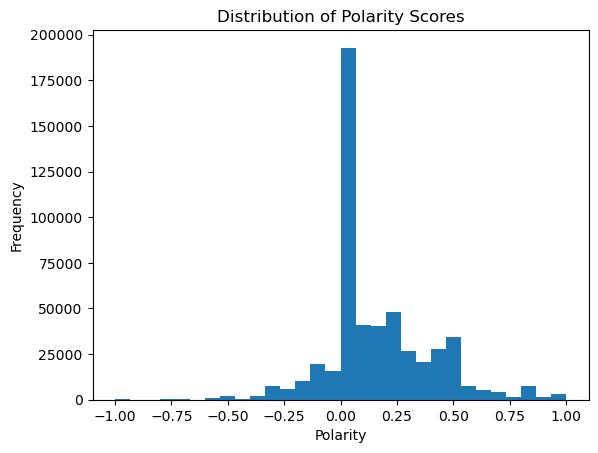

In [48]:
plt.hist(bc_df['polarity'], bins=30)
plt.title('Distribution of Polarity Scores')
plt.xlabel('Polarity')
plt.ylabel('Frequency')
plt.show()


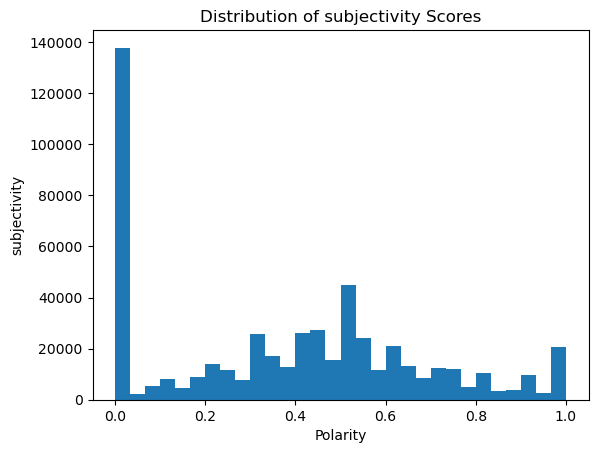

In [49]:
plt.hist(bc_df['subjectivity'], bins=30)
plt.title('Distribution of subjectivity Scores')
plt.xlabel('Polarity')
plt.ylabel('subjectivity')
plt.show()


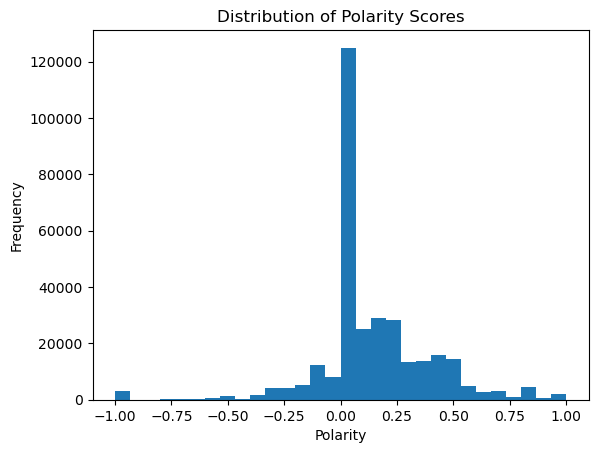

In [50]:
plt.hist(filtered_rows['polarity'], bins=30)
plt.title('Distribution of Polarity Scores')
plt.xlabel('Polarity')
plt.ylabel('Frequency')
plt.show()


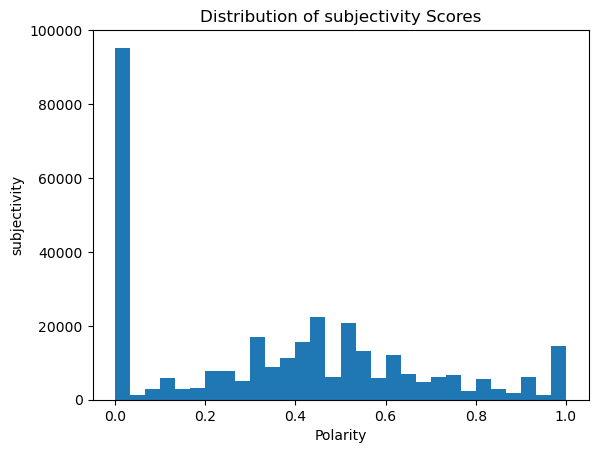

In [51]:
plt.hist(filtered_rows['subjectivity'], bins=30)
plt.title('Distribution of subjectivity Scores')
plt.xlabel('Polarity')
plt.ylabel('subjectivity')
plt.show()


In [52]:
bc_df['polarity_rounded'] = bc_df['polarity'].round(2)
bc_df['subjectivity_rounded'] = bc_df['subjectivity'].round(2)

filtered_rows['polarity_rounded'] = filtered_rows['polarity'].round(2)
filtered_rows['subjectivity_rounded'] = filtered_rows['subjectivity'].round(2)


/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/2943003378.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df['polarity_rounded'] = bc_df['polarity'].round(2)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/2943003378.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df['subjectivity_rounded'] = bc_df['subjectivity'].round(2)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/2943003378.py:4: SettingWithCopyWarning: 
A value is trying to be set on 

In [53]:
grouped = bc_df.groupby(['polarity_rounded', 'subjectivity_rounded']).size().reset_index(name='counts')

In [54]:
grouped_n = filtered_rows.groupby(['polarity_rounded', 'subjectivity_rounded']).size().reset_index(name='counts')

In [55]:
grouped

,polarity_rounded,subjectivity_rounded,counts
0,-1.00,1.00,472
1,-0.90,0.60,1
2,-0.90,0.70,1
3,-0.90,0.90,1
4,-0.90,0.95,1
...,...,...,...
6592,0.97,0.73,1
6593,1.00,0.30,1605
6594,1.00,0.60,2
6595,1.00,0.65,4


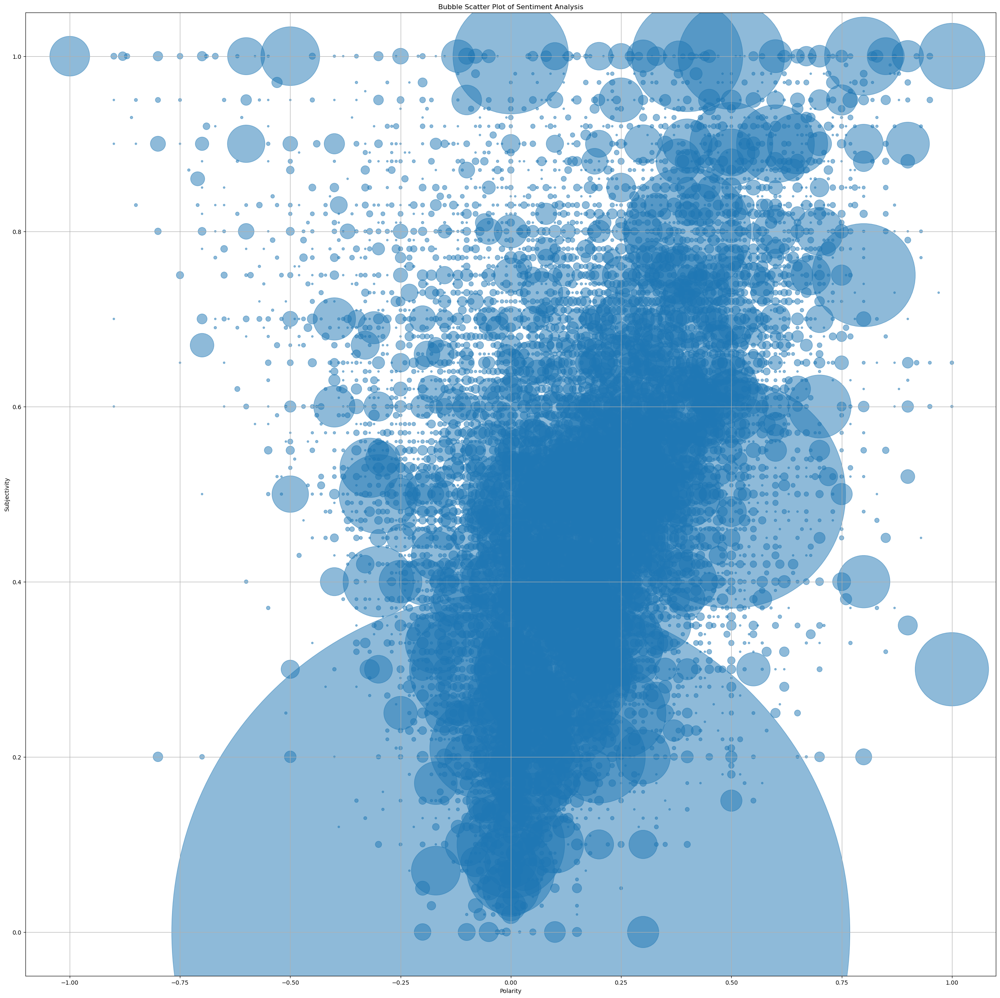

In [56]:
plt.figure(figsize=(30, 30))


plt.scatter(grouped['polarity_rounded'], grouped['subjectivity_rounded'], s=grouped['counts']*10, alpha=0.5)


plt.title('Bubble Scatter Plot of Sentiment Analysis')
plt.xlabel('Polarity')
plt.ylabel('Subjectivity')


plt.grid(True)


plt.show()

In [57]:
conditions_n = [
    (grouped_n['polarity_rounded'] < 0),
    (grouped_n['polarity_rounded'] == 0),
    (grouped_n['polarity_rounded'] > 0)
]


colors = ['red', 'grey', 'green']


grouped_n['color'] = np.select(conditions_n, colors)

In [58]:
conditions = [
    (grouped['polarity_rounded'] < 0),
    (grouped['polarity_rounded'] == 0),
    (grouped['polarity_rounded'] > 0)
]


colors = ['red', 'grey', 'green']


grouped['color'] = np.select(conditions, colors)

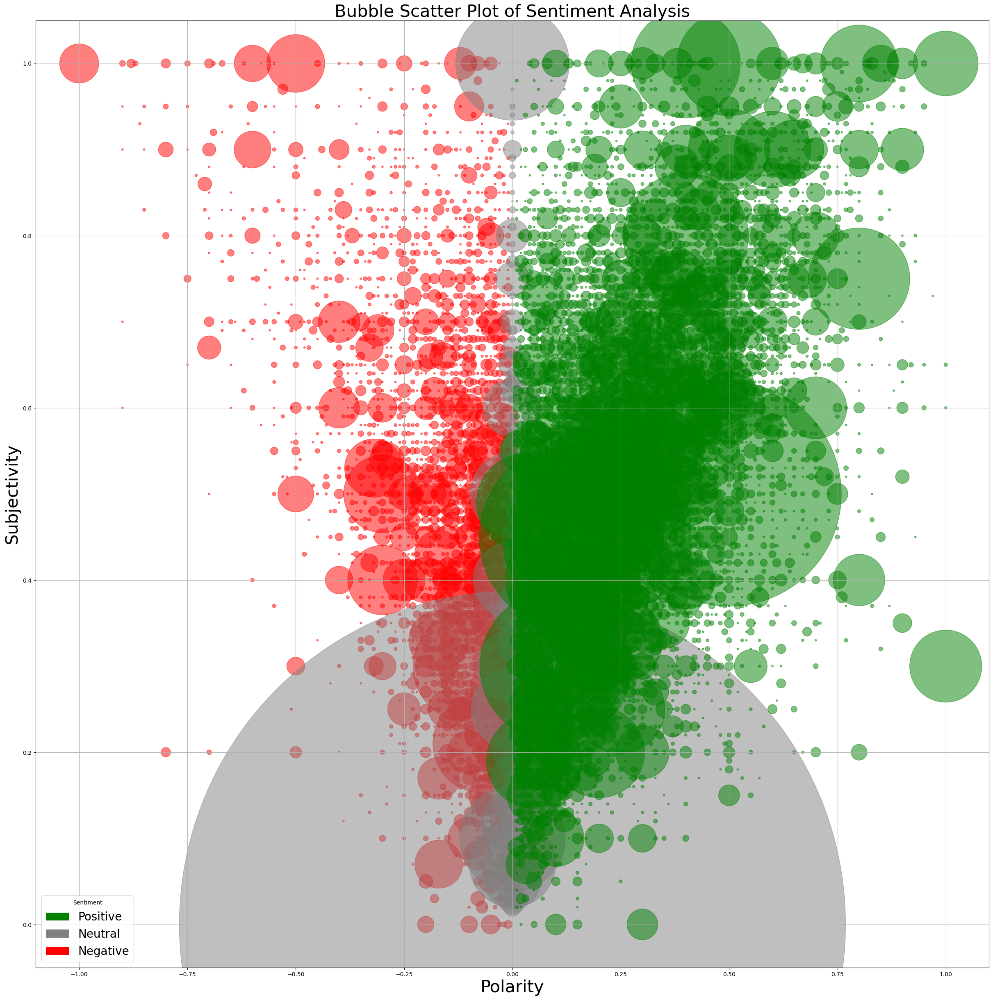

In [59]:

plt.figure(figsize=(30, 30))


plt.scatter(grouped['polarity_rounded'], grouped['subjectivity_rounded'],
            s=grouped['counts']*10, c=grouped['color'], alpha=0.5)


plt.title('Bubble Scatter Plot of Sentiment Analysis', fontsize=30)
plt.xlabel('Polarity', fontsize=30)
plt.ylabel('Subjectivity', fontsize=30)


plt.grid(True)


from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='green', label='Positive'),
                   Patch(facecolor='grey', label='Neutral'),
                   Patch(facecolor='red', label='Negative')]
plt.legend(handles=legend_elements, title="Sentiment",fontsize=20)


plt.show()


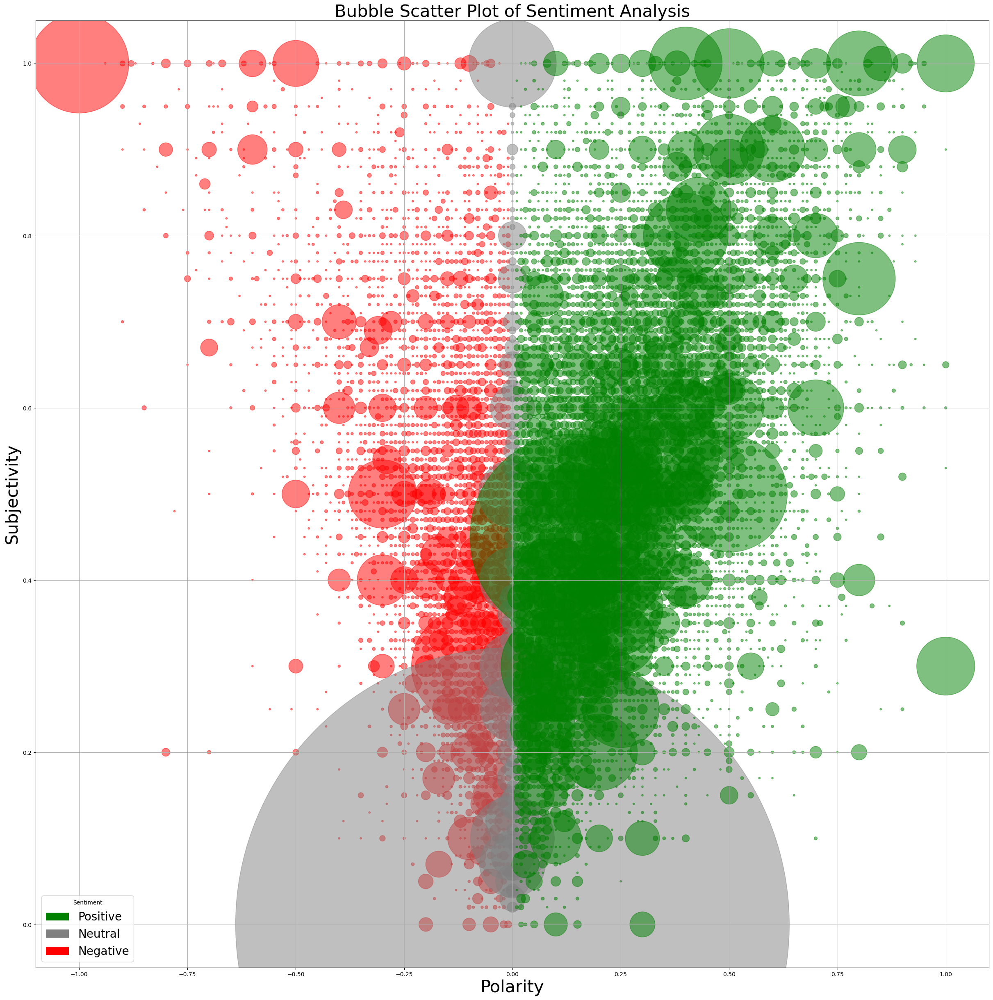

In [60]:
plt.figure(figsize=(30, 30))


plt.scatter(grouped_n['polarity_rounded'], grouped_n['subjectivity_rounded'],
            s=grouped_n['counts']*10, c=grouped_n['color'], alpha=0.5)


plt.title('Bubble Scatter Plot of Sentiment Analysis', fontsize=30)
plt.xlabel('Polarity', fontsize=30)
plt.ylabel('Subjectivity', fontsize=30)


plt.grid(True)


from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='green', label='Positive'),
                   Patch(facecolor='grey', label='Neutral'),
                   Patch(facecolor='red', label='Negative')]
plt.legend(handles=legend_elements, title="Sentiment",fontsize=20)


plt.show()


# Sentiment analysis of Quotes and Retweet

In [54]:
bc_df['sourcetweet_type'].unique()

array(['retweeted', 'quoted'], dtype=object)

In [55]:
bc_df_rt = bc_df[bc_df['sourcetweet_type'] == 'retweeted']
bc_df_qo = bc_df[bc_df['sourcetweet_type'] == 'quoted']

In [56]:

bc_df_rt['sentiment'] = bc_df_rt['cleaned_tweets'].apply(analyze_sentiment)
bc_df_qo['sentiment'] = bc_df_qo['cleaned_tweets'].apply(analyze_sentiment)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/4219775152.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df_rt['sentiment'] = bc_df_rt['cleaned_tweets'].apply(analyze_sentiment)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/4219775152.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df_qo['sentiment'] = bc_df_qo['cleaned_tweets'].apply(analyze_sentiment)


In [64]:
bc_df_rt['polarity'] = bc_df_rt['sentiment'].apply(lambda x: x.polarity)
bc_df_rt['subjectivity'] = bc_df_rt['sentiment'].apply(lambda x: x.subjectivity)


bc_df_qo['polarity'] = bc_df_qo['sentiment'].apply(lambda x: x.polarity)
bc_df_qo['subjectivity'] = bc_df_qo['sentiment'].apply(lambda x: x.subjectivity)


/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/1023011715.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df_rt['polarity'] = bc_df_rt['sentiment'].apply(lambda x: x.polarity)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/1023011715.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df_rt['subjectivity'] = bc_df_rt['sentiment'].apply(lambda x: x.subjectivity)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/1023011715.py:5: SettingWithCopyWarni

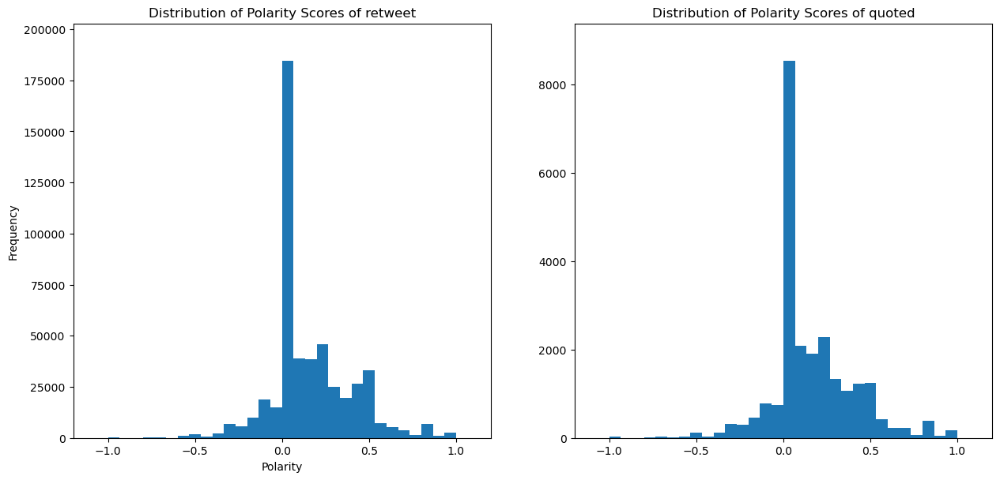

In [65]:
plt.figure(figsize=(15, 15))

ax1 = plt.subplot(221)
ax1.margins(0.1) 
ax1.hist(bc_df_rt['polarity'], bins=30)
ax1.set_title('Distribution of Polarity Scores of retweet')
plt.xlabel('Polarity')
plt.ylabel('Frequency')

ax2 = plt.subplot(222)
ax2.margins(0.1) 
ax2.hist(bc_df_qo['polarity'], bins=30)
ax2.set_title('Distribution of Polarity Scores of quoted')
# ax2.xlabel('Polarity')
# ax2.ylabel('Frequency')

plt.show()

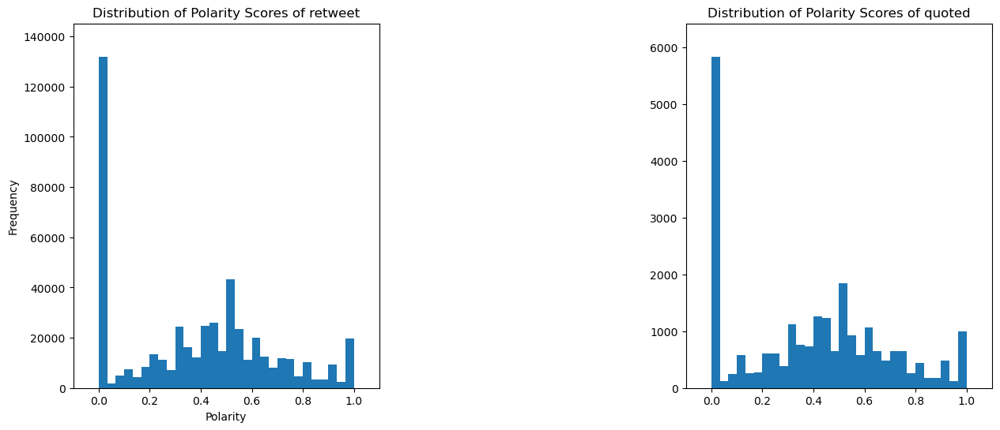

In [66]:
plt.figure(figsize=(15, 15))

ax1 = plt.subplot(221)
ax1.margins(0.1) 
ax1.hist(bc_df_rt['subjectivity'], bins=30)
ax1.set_title('Distribution of Polarity Scores of retweet')
plt.xlabel('Polarity')
plt.ylabel('Frequency')

ax2 = plt.subplot(222)
ax2.margins(0.1) 
ax2.hist(bc_df_qo['subjectivity'], bins=30)
ax2.set_title('Distribution of Polarity Scores of quoted')
# ax2.xlabel('Polarity')
# ax2.ylabel('Frequency')

plt.subplots_adjust(wspace=1, hspace=0.5)


plt.show()

In [67]:
bc_df_rt['polarity_rounded'] = bc_df_rt['polarity'].round(2)
bc_df_rt['subjectivity_rounded'] = bc_df_rt['subjectivity'].round(2)

bc_df_qo['polarity_rounded'] = bc_df_qo['polarity'].round(2)
bc_df_qo['subjectivity_rounded'] = bc_df_qo['subjectivity'].round(2)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/1625296014.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df_rt['polarity_rounded'] = bc_df_rt['polarity'].round(2)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/1625296014.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bc_df_rt['subjectivity_rounded'] = bc_df_rt['subjectivity'].round(2)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/1625296014.py:4: SettingWithCopyWarning: 
A value is trying t

In [68]:
grouped_rt = bc_df_rt.groupby(['polarity_rounded', 'subjectivity_rounded']).size().reset_index(name='counts')
grouped_qo = bc_df_qo.groupby(['polarity_rounded', 'subjectivity_rounded']).size().reset_index(name='counts')

In [69]:
conditions = [
    (grouped_rt['polarity_rounded'] < 0),
    (grouped_rt['polarity_rounded'] == 0),
    (grouped_rt['polarity_rounded'] > 0)
]


colors = ['red', 'grey', 'green']


grouped_rt['color'] = np.select(conditions, colors)


In [70]:
conditions = [
    (grouped_qo['polarity_rounded'] < 0),
    (grouped_qo['polarity_rounded'] == 0),
    (grouped_qo['polarity_rounded'] > 0)
]

grouped_qo['color'] = np.select(conditions, colors)

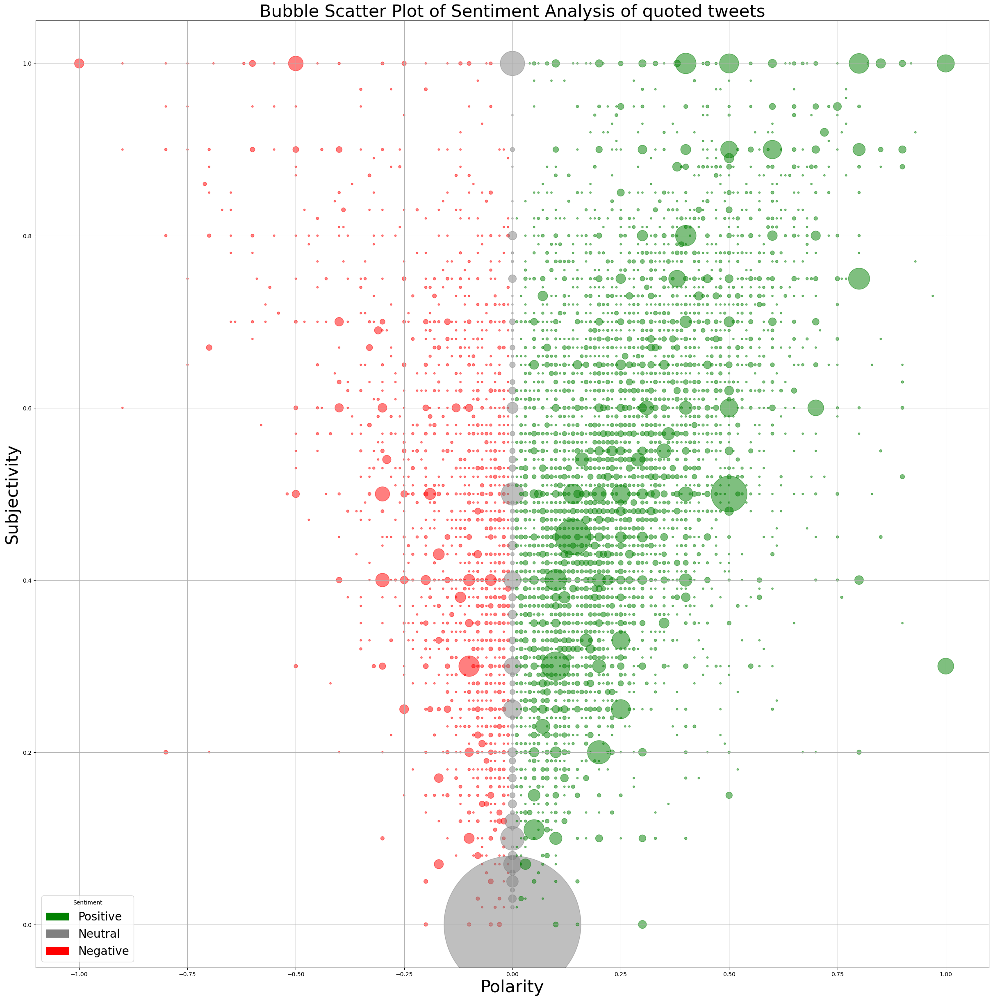

In [71]:

plt.figure(figsize=(30, 30))


plt.scatter(grouped_qo['polarity_rounded'], grouped_qo['subjectivity_rounded'],
            s=grouped_qo['counts']*10, c=grouped_qo['color'], alpha=0.5)


plt.title('Bubble Scatter Plot of Sentiment Analysis of quoted tweets', fontsize=30)
plt.xlabel('Polarity', fontsize=30)
plt.ylabel('Subjectivity', fontsize=30)


plt.grid(True)


from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='green', label='Positive'),
                   Patch(facecolor='grey', label='Neutral'),
                   Patch(facecolor='red', label='Negative')]
plt.legend(handles=legend_elements, title="Sentiment",fontsize=20)


plt.show()


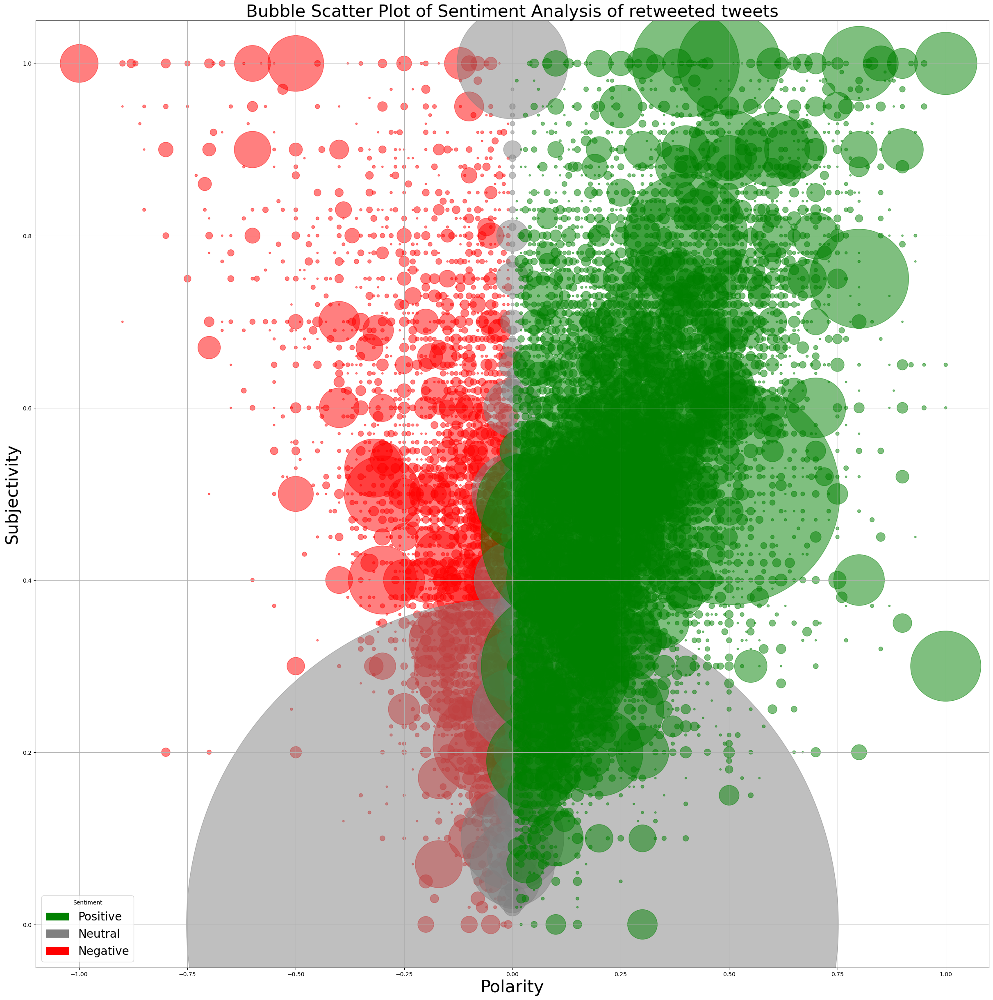

In [72]:

plt.figure(figsize=(30, 30))


plt.scatter(grouped_rt['polarity_rounded'], grouped_rt['subjectivity_rounded'],
            s=grouped_rt['counts']*10, c=grouped_rt['color'], alpha=0.5)


plt.title('Bubble Scatter Plot of Sentiment Analysis of retweeted tweets', fontsize=30)
plt.xlabel('Polarity', fontsize=30)
plt.ylabel('Subjectivity', fontsize=30)


plt.grid(True)


from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='green', label='Positive'),
                   Patch(facecolor='grey', label='Neutral'),
                   Patch(facecolor='red', label='Negative')]
plt.legend(handles=legend_elements, title="Sentiment",fontsize=20)


plt.show()


# Word Cloud

In [58]:
text = " ".join(tweet for tweet in bc_df_qo['cleaned_tweets'])

In [74]:
text

'clinical director speaks minefield money issues whats plan help cure million americans diagnosed cancer die dont wait loved one front line join fight im oncologist got learned breast lump deserves medical attention know expect clinical breast exam happens lump needs evaluation marks th anniversary mums death want something positive memory ive signed would brillliant could support make donation evidence shows general greater number months women continue babies greater protection women discussion penn plastic surgeons perform worlds first robotic bilateral breast reconstruction cant figure go back time suspect started tweeting immunotherapy ago take look milestones chart impatient rebuttal true patient advocates must students evidencebased medicine new post january st pm december issue influence age clinical outcome men development second primary cancers effects adjuvant tamoxifen cytotoxic therapy mortality early breast cancer dec positions available come work us really cool projects d

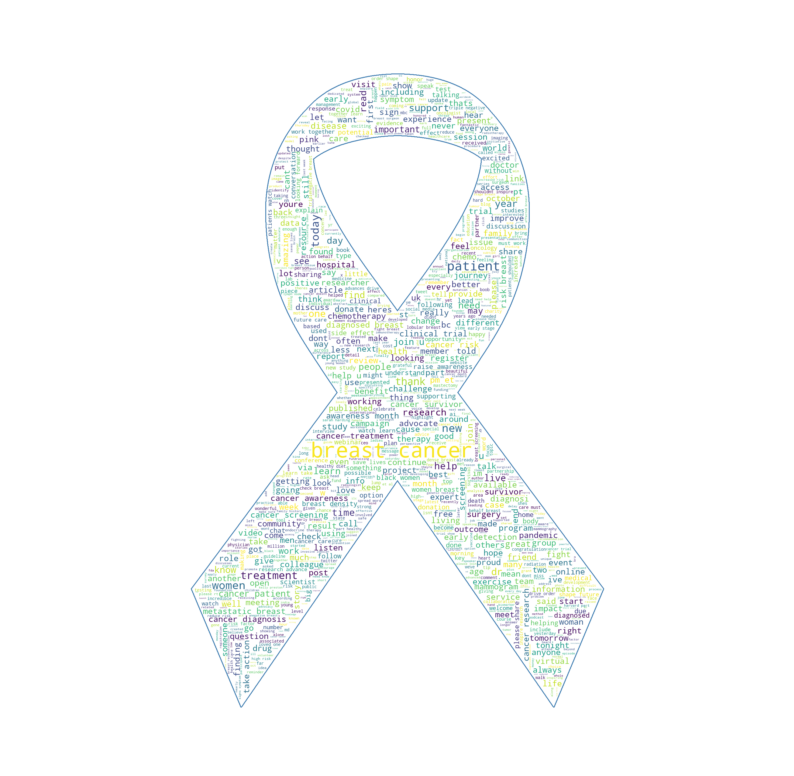

In [75]:
mask = np.array(Image.open("sc.png"))

wc = WordCloud(background_color="white", max_words=1000, mask=mask,
               stopwords=STOPWORDS, contour_width=3, contour_color='steelblue')


wc.generate(text)


plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()


In [59]:
words = text.split()


positive_words = defaultdict(int)
negative_words = defaultdict(int)
neutral_words = defaultdict(int)


for word in words:
    
    sentiment = TextBlob(word).sentiment
    if sentiment.polarity > 0:
        positive_words[word] += 1  
    elif sentiment.polarity < 0:
        negative_words[word] += 1
    else:
        neutral_words[word] += 1



In [60]:
def generate_wordcloud(word_freqs, title, colormap):
    # Generate word cloud
    wc = WordCloud(width=800, height=800, background_color='white', 
                   max_words=200, colormap=colormap, contour_width=3, 
                   contour_color='steelblue', stopwords=STOPWORDS)
    wc.generate_from_frequencies(word_freqs)
    return wc

    # Display the word cloud
    plt.figure(figsize=(8, 8))
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title, fontsize=20)
    plt.axis('off')
    plt.show()
    


In [61]:
wc_positive = generate_wordcloud(positive_words, 'Positive Words', 'PuRd_r')
wc_negative = generate_wordcloud(negative_words, 'Negative Words','winter')
wc_neutral = generate_wordcloud(neutral_words, 'Neutral Words','cool')

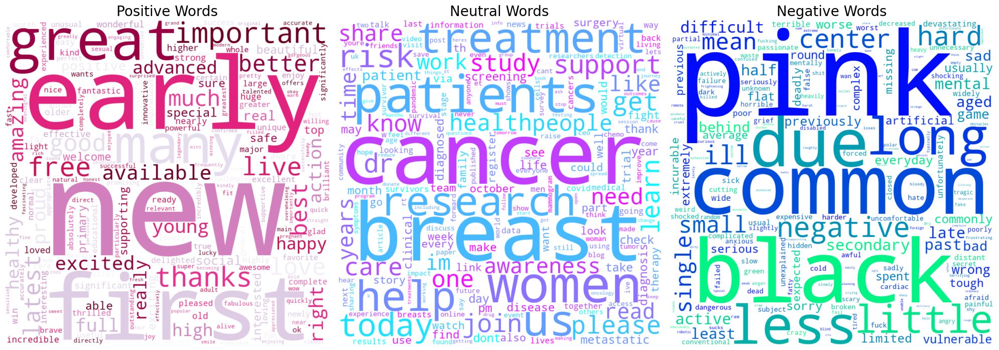

In [62]:
fig, axs = plt.subplots(1, 3, figsize=(20, 7))

axs[0].imshow(wc_positive, interpolation='bilinear')
axs[0].set_title('Positive Words', fontsize=20)
axs[0].axis('off')

axs[1].imshow(wc_neutral, interpolation='bilinear')
axs[1].set_title('Neutral Words', fontsize=20)
axs[1].axis('off')

axs[2].imshow(wc_negative, interpolation='bilinear')
axs[2].set_title('Negative Words', fontsize=20)
axs[2].axis('off')



plt.tight_layout()
plt.show()

#### Non BOT
Twitter Web Client
Twitter for iPhone
Twitter for Android
Twitter for iPad
Twitter Web App
Twitter Media Studio
Twitterrific for iOS
CCPtoCCPTwitter
Twitter SMS
Primal for Twitter
Twitter for BlackBerry
Twitter_SMAP
Twitter Utility
HemOnc Today Twitter
Healio Twitter
Twitter for BlackBerry®
Twitterrific for Mac
Twitter Handy
MyTwitteriWillNotBonk
My Twitter Friends II
Twitter for  iPhone
Twitter Chores
ABC Columbia Twitter
AutomateTwitter.com
Twitter for Mac
Metricool Twitter
WP to Twitter EPR
Twitterfall
Marky_Sparky_Twittery
Twitter For Downloading Coffee
Bubble For Twitter
Streamlabs Twitter
FollowMeTwitter
Twitter
Twitter for addempsea
STwitterStreamAnalytics
Twitter App v9.0.1
BestTwitterUsers
Yext Twitter Management
Twitter for Advertisers
Simple Tweet Reader for Twitter
Twitter Web AppBrowser
WP to Twitter Pro
Twitter Media Studio - LiveCut
Motivational Twitter Application
Twitter Automation Control Centr
Fenice for Twitter - Windows 10
DP-EN - Twitter Auto-Posting
SocialWeaver for Twitter
Vsocial for Twitter
M360 Twitter APIs App

#### BOT
Twitter for Advertisers.
TwitterBot907
Testing Twitter botting App
Twitter Ads
Twitter Bot 2020_87
Sarah_BAI_Twitter_Bot
TwitterAppBots
Twitter Bot GD
Broccoli Man Twitter Bot
Twitter nomnom bot
Twitter Bot 1996
PPCM Twitter Bots (labnol)
BlackTech Twitter Bot
TwitterBot12121
Twitter Bot #1
Twitter Bot IoT

#### remove
Twitter Retweet test
TwitterinvFirebaseLogin

In [63]:

df_nb = breast_cancer[breast_cancer['source'].isin(["Twitter Web Client","Twitter for iPhone","Twitter for Android","Twitter for iPad","Twitter Web App","Twitter Media Studio","Twitterrific for iOS","CCPtoCCPTwitter","Twitter SMS","Primal for Twitter","Twitter for BlackBerry","Twitter_SMAP","Twitter Utility","HemOnc Today Twitter","Healio Twitter","Twitter for BlackBerry®","Twitterrific for Mac","Twitter Handy","MyTwitteriWillNotBonk","My Twitter Friends II","Twitter for  iPhone","Twitter Chores","ABC Columbia Twitter","AutomateTwitter.com","Twitter for Mac","Metricool Twitter","WP to Twitter EPR","Twitterfall","Marky_Sparky_Twittery","Twitter For Downloading Coffee","Bubble For Twitter","Streamlabs Twitter","FollowMeTwitter","Twitter","Twitter for addempsea","STwitterStreamAnalytics","Twitter App v9.0.1","BestTwitterUsers","Yext Twitter Management","Twitter for Advertisers","Simple Tweet Reader for Twitter","Twitter Web AppBrowser","WP to Twitter Pro","Twitter Media Studio - LiveCut","Motivational Twitter Application","Twitter Automation Control Centr","Fenice for Twitter - Windows 10","DP-EN - Twitter Auto-Posting","SocialWeaver for Twitter","Vsocial for Twitter","M360 Twitter APIs App"])]

df_b = breast_cancer[breast_cancer['source'].isin(["Twitter for Advertisers.","TwitterBot907","Testing Twitter botting App","Twitter Ads","Twitter Bot 2020_87","Sarah_BAI_Twitter_Bot","TwitterAppBots","Twitter Bot GD","Broccoli Man Twitter Bot","Twitter nomnom bot","Twitter Bot 1996","PPCM Twitter Bots (labnol)","BlackTech Twitter Bot","TwitterBot12121","Twitter Bot #1","Twitter Bot IoT"])]

In [64]:
df_nb.shape

(662378, 32)

In [65]:
df_b.shape

(1342, 32)

In [66]:
df_nb['cleaned_tweets'] = df_nb['text'].apply(clean_text)
df_b['cleaned_tweets'] = df_b['text'].apply(clean_text)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/586461338.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nb['cleaned_tweets'] = df_nb['text'].apply(clean_text)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/586461338.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_b['cleaned_tweets'] = df_b['text'].apply(clean_text)


In [86]:
a = df_nb['text'].unique()
b = df_b['text'].unique()

a = pd.DataFrame(a)
b = pd.DataFrame(b)

In [87]:
a.head()

,0
0,We need more research on #tnbc and #metastatic...
1,RT @workttech: *How To Eat To Prevent Breast C...
2,RT @fizzysnood: Just because it’s New Years Da...
3,"Just because it’s New Years Day, and just beca..."
4,RT @TheLancetOncol: Our December issue is now ...


In [88]:
a.shape , b.shape

((296921, 1), (1271, 1))

In [89]:
a['senti']=a[0].apply(analyze_sentiment)

In [90]:
b['senti']=b[0].apply(analyze_sentiment)

In [91]:
a['polarity'] = a['senti'].apply(lambda x: x.polarity)
a['subjectivity'] = a['senti'].apply(lambda x: x.subjectivity)


b['polarity'] = b['senti'].apply(lambda x: x.polarity)
b['subjectivity'] = b['senti'].apply(lambda x: x.subjectivity)

In [68]:
df_nb['sentiment'] = df_nb['cleaned_tweets'].apply(analyze_sentiment)
df_b['sentiment'] = df_b['cleaned_tweets'].apply(analyze_sentiment)

df_nb['polarity'] = df_nb['sentiment'].apply(lambda x: x.polarity)
df_nb['subjectivity'] = df_nb['sentiment'].apply(lambda x: x.subjectivity)


df_b['polarity'] = df_b['sentiment'].apply(lambda x: x.polarity)
df_b['subjectivity'] = df_b['sentiment'].apply(lambda x: x.subjectivity)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/3300388691.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nb['sentiment'] = df_nb['cleaned_tweets'].apply(analyze_sentiment)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/3300388691.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_b['sentiment'] = df_b['cleaned_tweets'].apply(analyze_sentiment)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_1769/3300388691.py:4: SettingWithCopyWarning: 
A value is try

Text(0.5, 1.0, 'Distribution of Polarity Scores of bots')

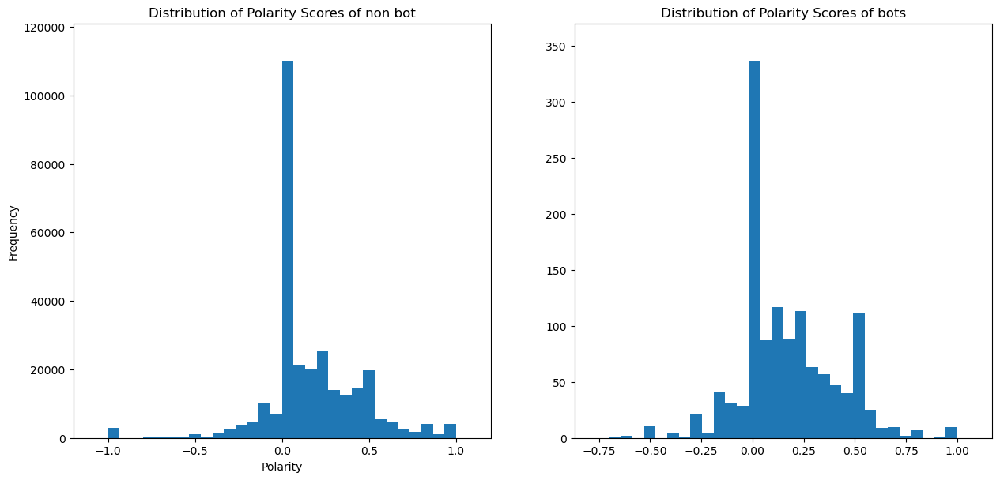

In [92]:
plt.figure(figsize=(15, 15))

ax1 = plt.subplot(221)
ax1.margins(0.1) 
ax1.hist(a['polarity'], bins=30)
ax1.set_title('Distribution of Polarity Scores of non bot')
plt.xlabel('Polarity')
plt.ylabel('Frequency')

ax2 = plt.subplot(222)
ax2.margins(0.1) 
ax2.hist(b['polarity'], bins=30)
ax2.set_title('Distribution of Polarity Scores of bots')
# ax2.xlabel('Polarity')
# ax2.ylabel('Frequency')


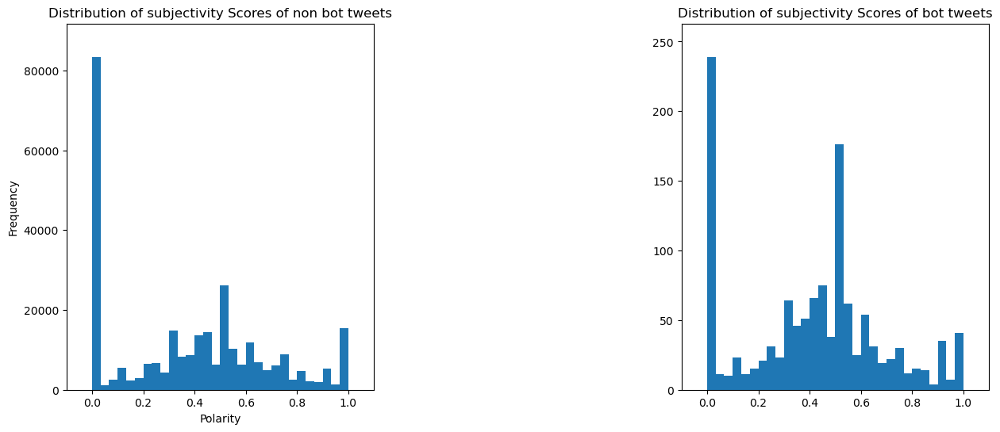

In [93]:
plt.figure(figsize=(15, 15))

ax1 = plt.subplot(221)
ax1.margins(0.1) 
ax1.hist(a['subjectivity'], bins=30)
ax1.set_title('Distribution of subjectivity Scores of non bot tweets')
plt.xlabel('Polarity')
plt.ylabel('Frequency')

ax2 = plt.subplot(222)
ax2.margins(0.1) 
ax2.hist(b['subjectivity'], bins=30)
ax2.set_title('Distribution of subjectivity Scores of bot tweets')
# ax2.xlabel('Polarity')
# ax2.ylabel('Frequency')

plt.subplots_adjust(wspace=1, hspace=0.5)


plt.show()

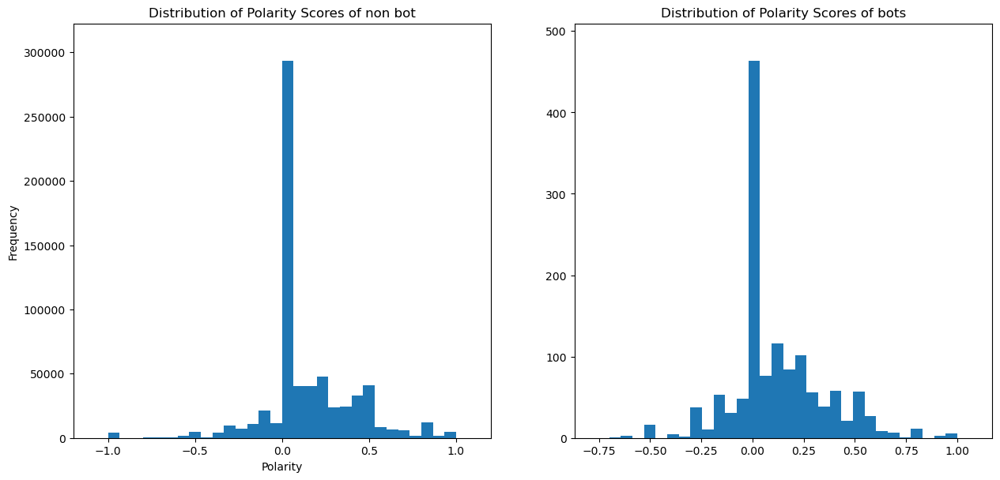

In [103]:
plt.figure(figsize=(15, 15))

ax1 = plt.subplot(221)
ax1.margins(0.1) 
ax1.hist(df_nb['polarity'], bins=30)
ax1.set_title('Distribution of Polarity Scores of non bot')
plt.xlabel('Polarity')
plt.ylabel('Frequency')

ax2 = plt.subplot(222)
ax2.margins(0.1) 
ax2.hist(df_b['polarity'], bins=30)
ax2.set_title('Distribution of Polarity Scores of bots')
# ax2.xlabel('Polarity')
# ax2.ylabel('Frequency')

plt.show()

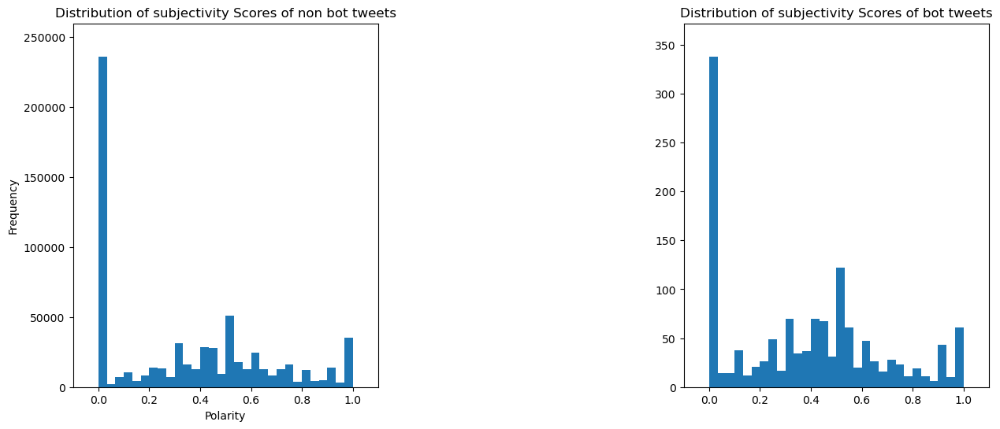

In [104]:
plt.figure(figsize=(15, 15))

ax1 = plt.subplot(221)
ax1.margins(0.1) 
ax1.hist(df_nb['subjectivity'], bins=30)
ax1.set_title('Distribution of subjectivity Scores of non bot tweets')
plt.xlabel('Polarity')
plt.ylabel('Frequency')

ax2 = plt.subplot(222)
ax2.margins(0.1) 
ax2.hist(df_b['subjectivity'], bins=30)
ax2.set_title('Distribution of subjectivity Scores of bot tweets')
# ax2.xlabel('Polarity')
# ax2.ylabel('Frequency')

plt.subplots_adjust(wspace=1, hspace=0.5)


plt.show()

In [87]:
df_nb['polarity_rounded'] = df_nb['polarity'].round(2)
df_nb['subjectivity_rounded'] = df_nb['subjectivity'].round(2)

df_b['polarity_rounded'] = df_b['polarity'].round(2)
df_b['subjectivity_rounded'] = df_b['subjectivity'].round(2)

/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/3742086378.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nb['polarity_rounded'] = df_nb['polarity'].round(2)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/3742086378.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nb['subjectivity_rounded'] = df_nb['subjectivity'].round(2)
/var/folders/8y/9mxnlvf9747fwz3rqxzxr58r0000gn/T/ipykernel_85386/3742086378.py:4: SettingWithCopyWarning: 
A value is trying to be set on 

In [94]:
a['polarity_rounded'] = a['polarity'].round(2)
a['subjectivity_rounded'] = a['subjectivity'].round(2)

b['polarity_rounded'] = b['polarity'].round(2)
b['subjectivity_rounded'] = b['subjectivity'].round(2)

In [93]:
# grouped_nb = df_nb.groupby(['polarity_rounded', 'subjectivity_rounded']).size().reset_index(name='counts')
# grouped_b = df_b.groupby(['polarity_rounded', 'subjectivity_rounded']).size().reset_index(name='counts')

In [95]:
grouped_nb = a.groupby(['polarity_rounded', 'subjectivity_rounded']).size().reset_index(name='counts')
grouped_b = b.groupby(['polarity_rounded', 'subjectivity_rounded']).size().reset_index(name='counts')

In [96]:
conditions_nb = [
    (grouped_nb['polarity_rounded'] < 0),
    (grouped_nb['polarity_rounded'] == 0),
    (grouped_nb['polarity_rounded'] > 0)
]

conditions_b = [
    (grouped_b['polarity_rounded'] < 0),
    (grouped_b['polarity_rounded'] == 0),
    (grouped_b['polarity_rounded'] > 0)
]

colors = ['red', 'grey', 'green']


grouped_nb['color'] = np.select(conditions_nb, colors)
grouped_b['color'] = np.select(conditions_b, colors)

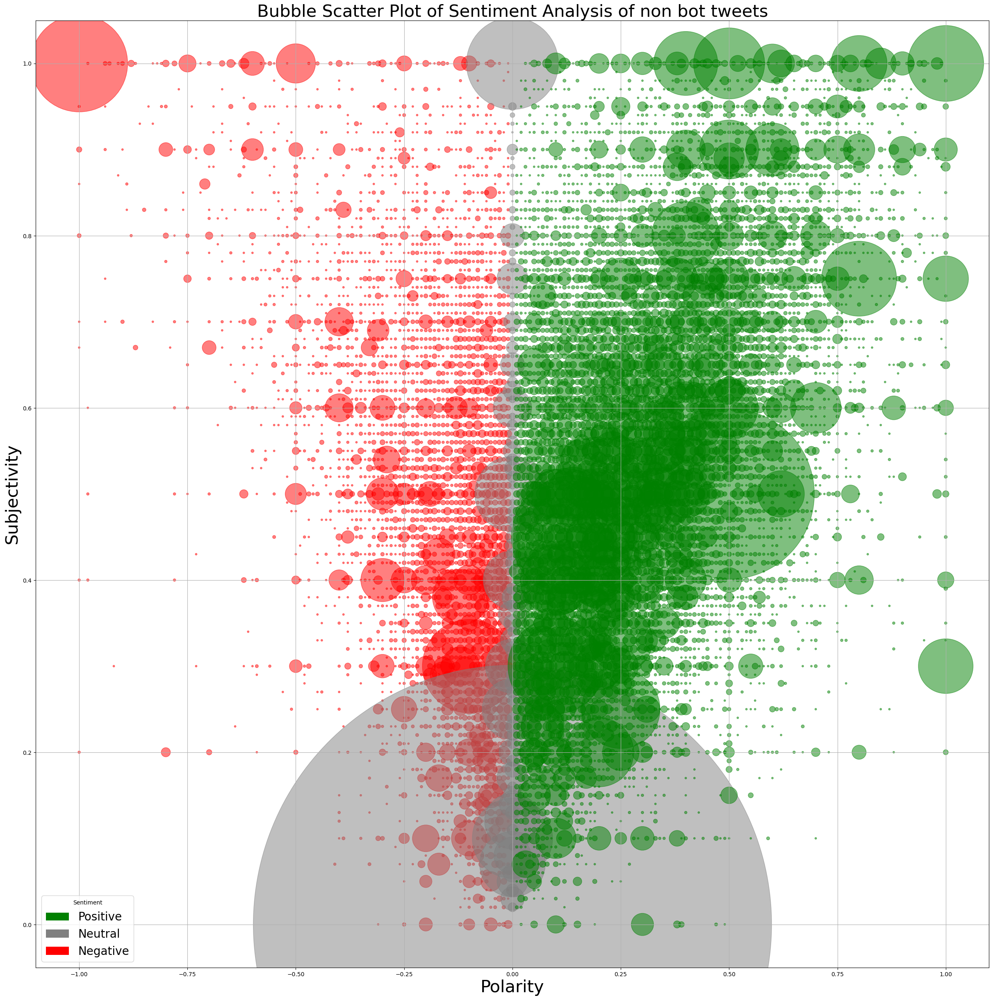

In [97]:

plt.figure(figsize=(30, 30))


plt.scatter(grouped_nb['polarity_rounded'], grouped_nb['subjectivity_rounded'],
            s=grouped_nb['counts']*10, c=grouped_nb['color'], alpha=0.5)


plt.title('Bubble Scatter Plot of Sentiment Analysis of non bot tweets', fontsize=30)
plt.xlabel('Polarity', fontsize=30)
plt.ylabel('Subjectivity', fontsize=30)


plt.grid(True)


from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='green', label='Positive'),
                   Patch(facecolor='grey', label='Neutral'),
                   Patch(facecolor='red', label='Negative')]
plt.legend(handles=legend_elements, title="Sentiment",fontsize=20)


plt.show()


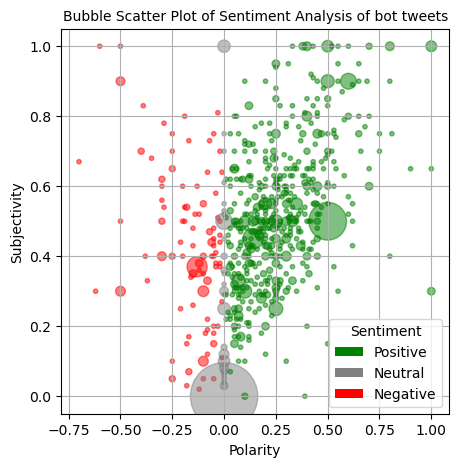

In [99]:

plt.figure(figsize=(5, 5))


plt.scatter(grouped_b['polarity_rounded'], grouped_b['subjectivity_rounded'],
            s=grouped_b['counts']*10, c=grouped_b['color'], alpha=0.5)


plt.title('Bubble Scatter Plot of Sentiment Analysis of bot tweets', fontsize=10)
plt.xlabel('Polarity', fontsize=10)
plt.ylabel('Subjectivity', fontsize=10)


plt.grid(True)


from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='green', label='Positive'),
                   Patch(facecolor='grey', label='Neutral'),
                   Patch(facecolor='red', label='Negative')]
plt.legend(handles=legend_elements, title="Sentiment",fontsize=10)


plt.show()
